# Embedded Questions - Finite clauseType

In this Notebook, I look at the breakdown of verbs in each kind of questions to understand better the semantic content of different types of questions.

For each wh-question type, I look first at emb_verb, the code for the first verb in the question, then v2_after, and then mat_verb. 

In [1]:
from __future__ import division
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl 
import numpy as np
import re

In [2]:
df = pd.read_json("final_corpus.json")

In [3]:
len(df)

427079

In [4]:
# # Remove the Brown corpus
df = df[df.corpus != "brown"]

In [5]:
len(df) #422983

422983

In [6]:
df['emb_verb'] = df['emb_verb'].replace({'Can': 'can', 'CAN': 'can', 'WILL': 'will', 'Will': 'will', 'Could': 'could', 'Would':'would', 'Should': 'should'})
df['v1_after'] = df['v1_after'].replace({'Can': 'can', 'CAN': 'can', 'WILL': 'will', 'Will': 'will', 'Could': 'could', 'Would':'would', 'Should': 'should'})

In [7]:
emb = df[df.questType == "Embeded Question"]

In [8]:
# This makes the display show more info
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)

In [9]:
mod = emb[emb.clauseType == "Modal"]
fin = emb[emb.clauseType == "Finite"]
nonfin = emb[emb.clauseType == "Non-Finite"]
other = df.loc[~df.clauseType.isin(["Modal","Finite", "Non-Finite"])]

In [10]:
len(other)

0

In [11]:
er = df.loc[df.questType.isin(["Root Question","Embeded Question"])]

In [12]:
len(er)

74658

In [13]:
len(mod)/len(emb)*100

11.949435522340595

In [14]:
len(fin)/len(emb)*100

79.70795568982881

In [15]:
len(nonfin)/len(emb)*100

8.342608787830603

# B. Finite

In [16]:
fin_vs = fin.groupby('emb_verb').filter(lambda x: len(x) >= 350)

In [17]:
fin_vs.groupby(["questType", "wh", "emb_verb"])["questType"].count()

questType         wh     emb_verb
Embeded Question  how    's          1348
                         've         224 
                         be          5071
                         come        215 
                         do          931 
                         get         439 
                         go          306 
                         have        1485
                  where  's          835 
                         've         138 
                         be          4038
                         come        384 
                         do          258 
                         get         239 
                         go          303 
                         have        635 
                  who    's          422 
                         've         18  
                         be          1577
                         come        16  
                         do          118 
                         get         43  
                         go          26  


In [18]:
fin_who = fin.loc[fin.wh.isin(["who"])]
fin_where = fin.loc[fin.wh.isin(["where"])]
fin_how = fin.loc[fin.wh.isin(["how"])]

# B1. Finite How

In [19]:
fin_how.groupby(["emb_verb"])["emb_verb"].count()

emb_verb
'd               187 
'll              104 
's               1348
've              224 
Became           1   
Composed         1   
Do               1   
Found            1   
Friend           1   
Gates            1   
Grow             1   
Is               1   
MPs              1   
Sgr              1   
Won              1   
Wright           1   
]                1   
abandon          1   
absorb           2   
abuse            1   
accelerate       1   
accept           3   
accompany        1   
accord           2   
accost           1   
account          1   
accumulate       1   
accurate         1   
accuse           3   
ache             2   
achieve          13  
acquire          4   
act              10  
adapt            7   
add              5   
address          3   
adhere           1   
adjust           1   
admire           3   
admit            2   
advance          1   
affect           51  
afflict          1   
afford           7   
afield           1   
a

In [20]:
f_how_vs = fin_how.groupby('emb_verb').filter(lambda x: len(x) >= 250)

In [21]:
f_how_vs_count = f_how_vs.groupby(["emb_verb"])["emb_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False).reset_index()

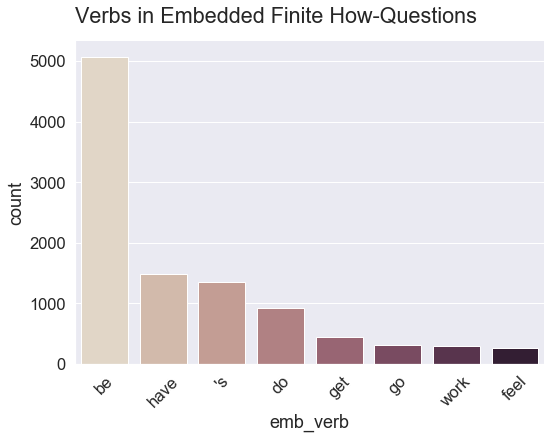

In [336]:
sns.set(font_scale=1.5)
g = sns.catplot(x="emb_verb", y="count", kind="bar", data=f_how_vs_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Verbs in Embedded Finite How-Questions')
g.set_xticklabels(rotation=45)

plt.show()

In [253]:
f_how_vs_count

,index,emb_verb,count
0,1,be,5071
1,5,have,1485
2,0,'s,1348
3,2,do,931
4,3,get,439
5,4,go,306


We can look at the sentences by substituting in the appropriate verb string in the following code.

In [261]:
fin_how.loc[fin_how.emb_verb.isin(["be"])].sentence

1124      But more studies are needed to show how closely the two are linked Breast cancer could be sexually transmitted , says a researcher who has found the same virus that causes cervical cancer in breast cancer tumours from Australian women .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

## v2_after
what verbs are coming after the first auxiliary verb?

In [22]:
# first filter so its not a super long list. We want to see the most frequent ones.
f_how_v2s = f_how_vs.groupby('v2_after').filter(lambda x: len(x) >= 120)
f_how_vs_v2_count = f_how_v2s.groupby(["emb_verb","v2_after"])["v2_after"].count().reset_index(name='count').sort_values(['count'], ascending=False)
# then look at the counts for those most frequent verbs
f_how_v2s.groupby(['emb_verb','v2_after'])['v2_after'].count()

emb_verb  v2_after
's                    1058
          be          10  
          been        19  
          do          3   
          going       35  
be                    1436
          be          94  
          been        2   
          do          52  
          going       206 
do                    187 
          be          1   
          been        1   
          do          45  
          going       1   
feel                  115 
          be          4   
          do          8   
get                   189 
          be          7   
          do          11  
          going       3   
go                    180 
          be          1   
          do          5   
          going       1   
have                  71  
          be          13  
          been        314 
          do          10  
work                  163 
          be          2   
          do          5   
Name: v2_after, dtype: int64

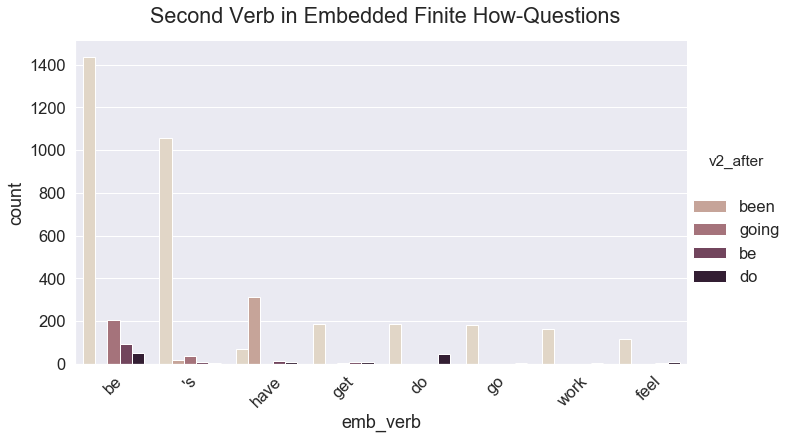

In [23]:
sns.set(font_scale=1.5)
g = sns.catplot(x="emb_verb", y="count",hue="v2_after", kind="bar", data=f_how_vs_v2_count, palette="ch:.25", height=6, aspect=10/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Second Verb in Embedded Finite How-Questions')
g.set_xticklabels(rotation=45)

plt.show()

### mat_verb

In [504]:
f_how_vs_mv = f_how_vs.groupby('mat_verb').filter(lambda x: len(x) >= 300)
f_how_vs_mv_count = f_how_vs_mv.groupby(["emb_verb","mat_verb"])["mat_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False)
f_how_vs_mv.groupby(['emb_verb','mat_verb'])['mat_verb'].count()

emb_verb  mat_verb
's        's          122
          be          86 
          know        256
          say         43 
          see         103
          show        29 
          wonder      44 
be        's          229
          be          374
          know        806
          say         212
          see         351
          show        265
          wonder      140
do        's          63 
          be          101
          know        147
          say         52 
          see         26 
          show        7  
          wonder      14 
feel      's          38 
          be          11 
          know        96 
          say         4  
          see         21 
          show        1  
          wonder      2  
get       's          78 
          be          31 
          know        123
          say         3  
          see         42 
          show        3  
          wonder      22 
go        's          30 
          be          16 
          know     

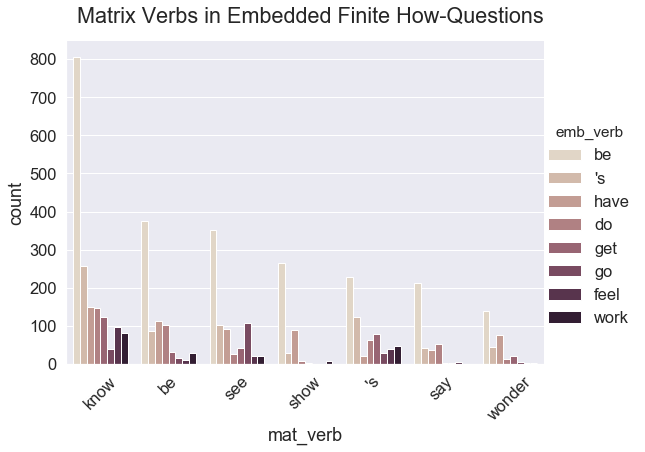

In [505]:
sns.set(font_scale=1.5)
g = sns.catplot(x="mat_verb", y="count", hue="emb_verb", kind="bar", data=f_how_vs_mv_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Matrix Verbs in Embedded Finite How-Questions')
g.set_xticklabels(rotation=45)

plt.show()

### What are those matrix verbs where the emb_verb is not followed by anything?

In [308]:
# subset the data
no_v2 = f_how_v2s.loc[f_how_v2s.v2_after == ""]

# filter just most frequent verbs
no_v2_mvs = no_v2.groupby('mat_verb').filter(lambda x: len(x) >= 100)
no_v2_mvs.groupby(["mat_verb","emb_verb"])["mat_verb"].count()

In [315]:
len(no_v2_mvs.loc[no_v2_mvs.mat_verb.isin(["'s"])])

270

In [320]:
no_v2_mvs.loc[no_v2_mvs.mat_verb.isin(["say"])].sentence

2083      Conway says how the practice is common among men and women in a variety of life situations . "                                                     
11162     And then you say, Now how many how many swallows in a cage?                                                                                        
11283     I'll say how are you?                                                                                                                              
20835     I'll say, How're things?                                                                                                                           
21259     No  it don't say how long though                                                                                                                   
28429     you wouldn't say how many toes have you?                                                                                                           
28779     You say, How are you?                     

### What are the verbs occurring after 'have'?

In [292]:
fh = fin_how.loc[fin_how.emb_verb.isin(["have"])]
fhb = fh.loc[fh.v2_after.isin(["been"])]
fhbvs = fhb.groupby('v3_after').filter(lambda x: len(x) >= 4)
fhbvs.groupby(['v3_after'])['v3_after'].count()

In [498]:
# fhbvs.sentence

# B2. Finite Where

In [338]:
f_where_vs = fin_where.groupby('emb_verb').filter(lambda x: len(x) >= 150)

In [339]:
f_where_vs_count = f_where_vs.groupby(["emb_verb"])["emb_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False)

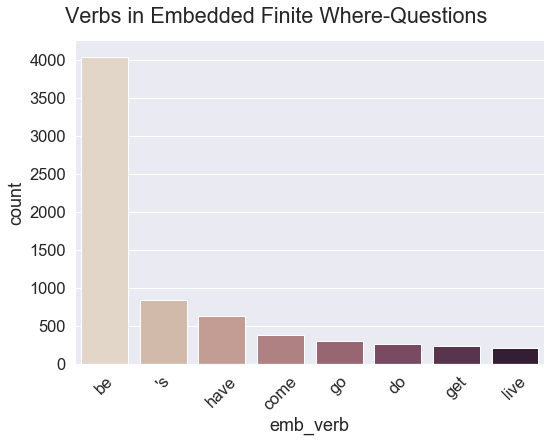

In [340]:
sns.set(font_scale=1.5)
g = sns.catplot(x="emb_verb", y="count", kind="bar", data=f_where_vs_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Verbs in Embedded Finite Where-Questions')
g.set_xticklabels(rotation=45)

plt.show()

In [406]:
f_where_vs_count

,emb_verb,count
1,be,4038
0,'s,835
6,have,635
2,come,384
5,go,303
3,do,258
4,get,239
7,live,214


In [444]:
fin_where.loc[fin_where.emb_verb.isin(["be"])].sentence

Series([], Name: sentence, dtype: object)

In [442]:
f_where_vs_mv.loc[f_where_vs_mv.emb_verb.isin(["be"])].sentence

Series([], Name: sentence, dtype: object)

# v2_after

In [449]:
f_where_vs_v2 = f_where_vs.groupby('v2_after').filter(lambda x: len(x) >= 100)
f_where_vs_v2_count = f_where_vs_v2.groupby(["emb_verb","v2_after"])["v2_after"].count().reset_index(name='count').sort_values(['count'], ascending=False)
f_where_vs_v2.groupby(['v2_after'])['v2_after'].count()

v2_after
         2687
's       112 
been     167 
going    354 
is       169 
was      116 
Name: v2_after, dtype: int64

In [429]:
len(f_where_vs_v2)/len(f_where_vs)*100

48.89950767448595

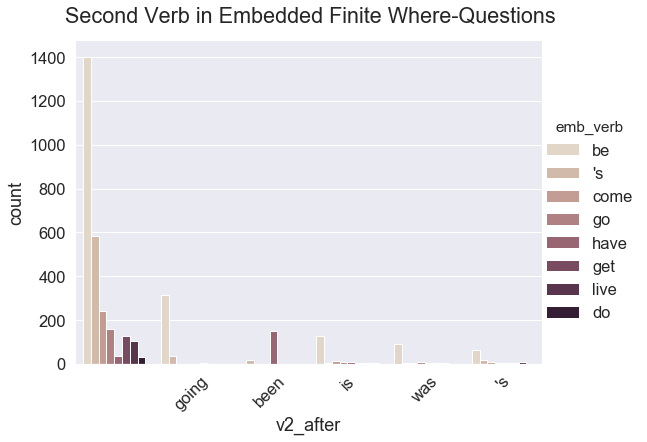

In [451]:
sns.set(font_scale=1.5)
g = sns.catplot(x="v2_after", y="count",hue="emb_verb", kind="bar", data=f_where_vs_v2_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Second Verb in Embedded Finite Where-Questions')
g.set_xticklabels(rotation=45)

plt.show()

In [448]:
# f_where_vs_v2.loc[f_where_vs_v2.emb_verb == ""].sentence

## mat_verb

Overall, what are the mvs?

In [439]:
f_where_vs_mv = f_where_vs.groupby('mat_verb').filter(lambda x: len(x) >= 150)
f_where_vs_mv_count = f_where_vs_mv.groupby(["emb_verb","mat_verb"])["mat_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False)
f_where_vs_mv.groupby(["emb_verb",'mat_verb'])['mat_verb'].count()

emb_verb  mat_verb
's        's          119 
          be          129 
          know        190 
          say         30  
          see         22  
          wonder      15  
be        's          327 
          be          623 
          know        1106
          say         74  
          see         90  
          wonder      92  
come      's          79  
          be          124 
          know        61  
          say         3   
          see         9   
          wonder      14  
do        's          22  
          be          46  
          know        26  
          say         23  
          see         1   
          wonder      3   
get       's          86  
          be          35  
          know        55  
          say         3   
          see         6   
          wonder      16  
go        's          65  
          be          47  
          know        64  
          say         1   
          see         18  
          wonder      13  
have     

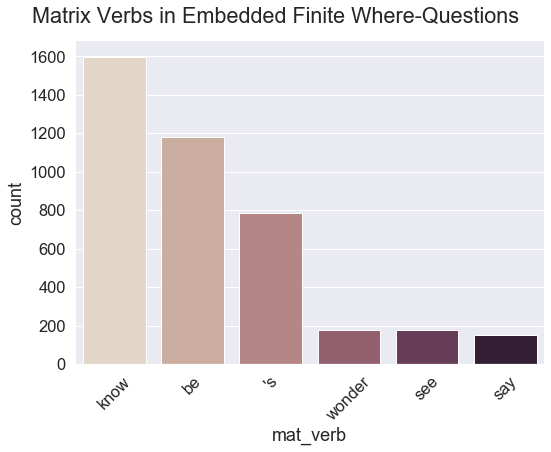

In [423]:
sns.set(font_scale=1.5)
g = sns.catplot(x="mat_verb", y="count", kind="bar", data=f_where_vs_mv_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Matrix Verbs in Embedded Finite Where-Questions')
g.set_xticklabels(rotation=45)

plt.show()

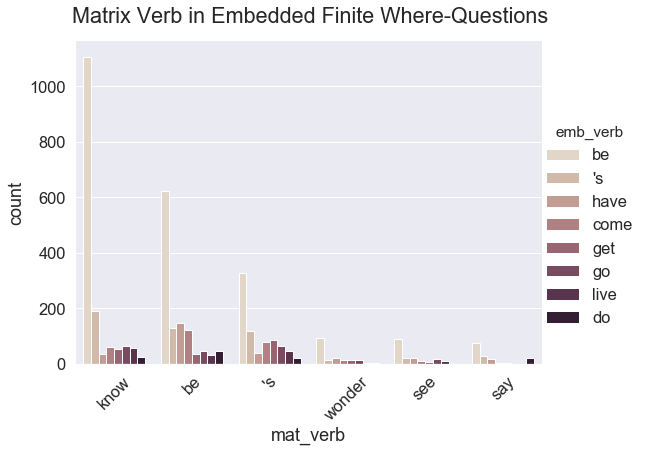

In [497]:
sns.set(font_scale=1.5)
g = sns.catplot(x="mat_verb", y="count",hue="emb_verb", kind="bar", data=f_where_vs_mv_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Matrix Verb in Embedded Finite Where-Questions')
g.set_xticklabels(rotation=45)

plt.show()

# B3. Finite Who


In [356]:
f_who_vs = fin_who.groupby('emb_verb').filter(lambda x: len(x) >= 40)

In [357]:
# f_who_vs.groupby('emb_verb')['emb_verb'].count()

In [358]:
f_who_vs_count = f_who_vs.groupby(["emb_verb"])["emb_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False)

In [359]:
f_who_vs_count

,emb_verb,count
1,be,1577
0,'s,422
4,have,200
2,do,118
5,know,45
3,get,43
7,want,42
6,mean,41


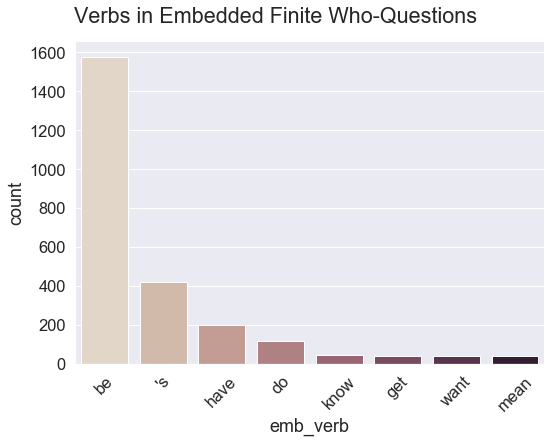

In [361]:
# It's weird to make a graph of this because there are so many occurrences of 'be' that overwhelm the rest.
sns.set(font_scale=1.5)
g = sns.catplot(x="emb_verb", y="count", kind="bar", data=f_who_vs_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Verbs in Embedded Finite Who-Questions')
g.set_xticklabels(rotation=45)

plt.show()

## v2_after

In [474]:
f_who_vs_v2 = f_who_vs.groupby('v2_after').filter(lambda x: len(x) >= 50)
f_who_vs_v2_count = f_who_vs_v2.groupby(["emb_verb","v2_after"])["v2_after"].count().reset_index(name='count').sort_values(['count'], ascending=False)
f_who_vs_v2.groupby(['emb_verb','v2_after'])['v2_after'].count()

emb_verb  v2_after
's                    203
          do          3  
          going       19 
          was         1  
be                    675
          do          38 
          going       30 
          was         46 
do                    32 
          do          3  
          was         2  
get                   24 
          do          1  
have                  13 
          do          2  
          going       1  
          was         4  
know                  13 
          do          1  
          was         2  
mean                  29 
          do          1  
          was         1  
want                  11 
          do          1  
Name: v2_after, dtype: int64

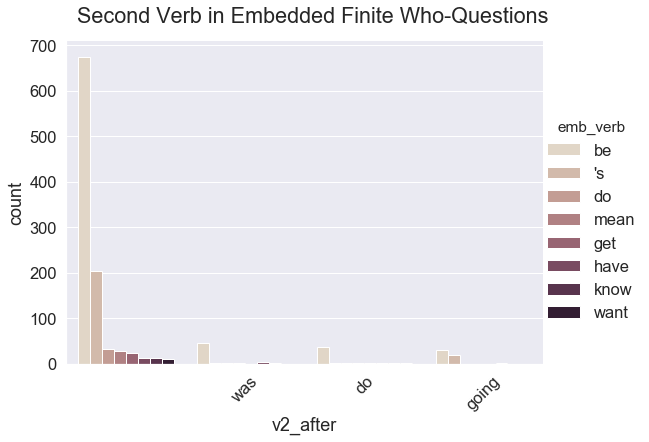

In [475]:
sns.set(font_scale=1.5)
g = sns.catplot(x="v2_after", y="count",hue="emb_verb", kind="bar", data=f_who_vs_v2_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Second Verb in Embedded Finite Who-Questions')
g.set_xticklabels(rotation=45)

plt.show()

In [483]:
f_who_vs_v2.loc[f_who_vs_v2.emb_verb == "know"].sentence

856       They could have been going down to eat , reproduce , hide ... who knows ? "                                                                                                                                                
40479     And some just disappeared, vanished never to be seen again, taken who knew when or where — though by whom was no mystery.                                                                                                  
54329     Waiters, lawyers, princes, paupers — who knows?                                                                                                                                                                            
136993    The Volvo is gone to who knows where.                                                                                                                                                                                      
138230    The question would then be: who knew how much en route?               

### BE
WHAT ABOUT PLURAL VERSUS SINGULAR? GET A SENSE OF WHETHER THERE ARE MORE MS/MA ANSWERS DESIRED FROM THE ADDRESSEE

In [ ]:
# This makes the display show more info
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)

In [20]:
f_who_be = fin_who[fin_who.emb_verb.isin(["be"])]

In [22]:
f_who_be.sentence

246       The Government can choose who it does business with and the Government usually chooses to do business with people whom it thinks are trustworthy , who are not going to commit fraud with federal dollars ," he said .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
247       The Government can choose who it does business with and the Government usually chooses to do business with people whom it thinks are trustworthy , who are not going to commit fraud with federal dollars ," he said .                                                                      

## mat_verb

In [487]:
f_who_vs_mv = f_who_vs.groupby('mat_verb').filter(lambda x: len(x) >= 75)
f_who_vs_mv_count = f_who_vs_mv.groupby(["emb_verb","mat_verb"])["mat_verb"].count().reset_index(name='count').sort_values(['count'], ascending=False)
f_who_vs_mv.groupby(['emb_verb','mat_verb'])['mat_verb'].count()

emb_verb  mat_verb
's        's          46 
          be          29 
          know        122
          say         24 
          see         20 
be        's          49 
          be          115
          know        670
          say         43 
          see         46 
do        's          4  
          be          9  
          know        36 
          say         7  
          see         1  
get       's          3  
          be          1  
          know        8  
          see         9  
have      's          2  
          be          18 
          know        21 
          say         7  
          see         6  
know      's          3  
          be          2  
          know        7  
          say         1  
          see         1  
mean      's          2  
          know        34 
          say         1  
          see         1  
want      be          3  
          know        6  
          say         4  
Name: mat_verb, dtype: int64

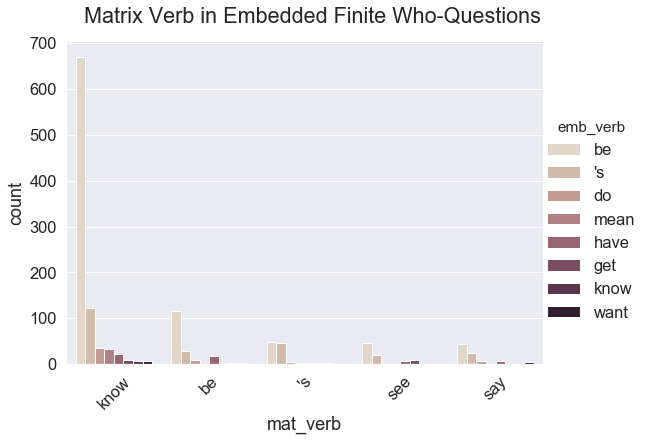

In [489]:
sns.set(font_scale=1.5)
g = sns.catplot(x="mat_verb", y="count",hue="emb_verb", kind="bar", data=f_who_vs_mv_count, palette="ch:.25", height=6, aspect=8/6)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Matrix Verb in Embedded Finite Who-Questions')
g.set_xticklabels(rotation=45)

plt.show()

### know-who-is

In [35]:
know_f_who_be = f_who_be[f_who_be.mat_verb.isin(["know"])]

In [36]:
len(know_f_who_be)

670

In [37]:
know_f_who_be.sentence

3546      He knows who we are.’                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
3983      Officials usually knew who they were, though they could not obtain the evidence needed to convict them in the courts.                                                                                                                                                                       

In [39]:
know_f_who_be_count = know_f_who_be.groupby(["v1_after"])["v1_after"].count().reset_index(name='count').sort_values(['count'], ascending=False)

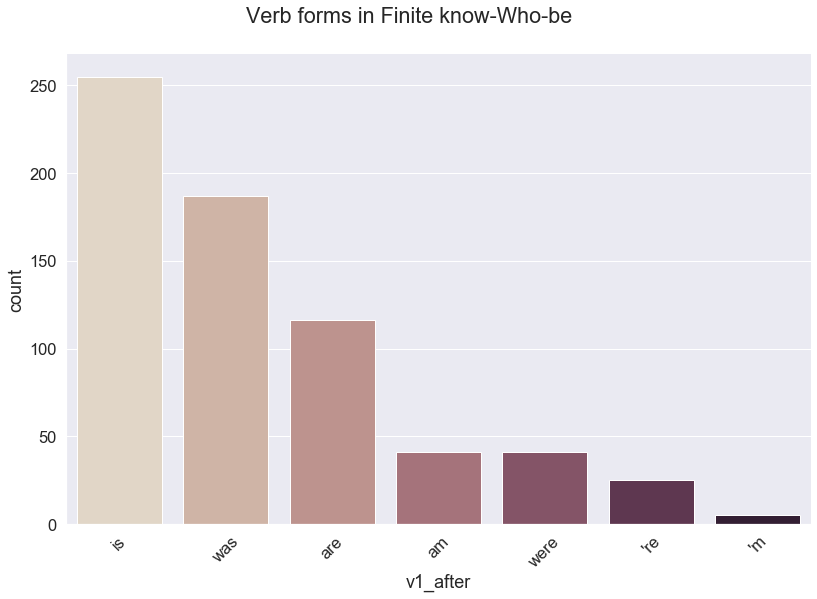

In [42]:
sns.set(font_scale=1.5)
g = sns.catplot(x="v1_after", y="count", kind="bar", data=know_f_who_be_count, palette="ch:.25", height=8.27, aspect=11.7/8.27)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Verb forms in Finite know-Who-be')
g.set_xticklabels(rotation=45)

plt.show()

### DO

In [52]:
f_who_do = fin_who[fin_who.emb_verb.isin(["do"])]

In [53]:
f_who_do.sentence

20386     I mean, who does he think he is?                                                                                                                                                                                                                                                                                                                                                                                                                                                         
21373     I don't know who you do that                                                                                                                                                                                                                                                                                                                                                                                                                                                             
21383     I know who done it.   

### HAVE

In [49]:
f_who_have = fin_who[fin_who.emb_verb.isin(["have"])]

In [50]:
f_who_have.sentence

6827      I then went on to think about who had clipped Secretary of State Samson's golden locks and, once again, I realised that it was the right hon. Member for Finchley.                                                                                                                                                                                                                                                       
6830      It is best to be candid also about who one has consulted.                                                                                                                                                                                                                                                                                                                                                                
9909      He neither knew nor cared who had been evicted from it and left destitute.                                                                            

### 'S

In [62]:
f_who_s = fin_who[fin_who.emb_verb.isin(["'s"])]

In [63]:
len(f_who_s)

422

In [60]:
f_who_s.sentence

5661      They would also want to know who markets the food and its price.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
9372      Of course, the Flat parts of the cards don't suffer, but then who's interested in Flat racing at Down Royal and Downpatrick.                                                                                                                                                                                                                                                                                                             

In [66]:
m = f_who_s.groupby(["v2_after"]).filter(lambda x: len(x) >= 10)
m.groupby("v2_after")["v2_after"].count()

v2_after
         203
's       10 
been     10 
going    19 
got      15 
is       12 
Name: v2_after, dtype: int64